### Análisis exploratorio 

Siguiendo con los mismos datos:

In [2]:
import pandas as pd, numpy as np
datos=pd.read_csv("house.csv")

In [8]:
#paquete útil para generar reportes
pip install pandas-profiling


  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27096 sha256=e39a09394368a74847a6df3eee12ea42b1ef8cf53839a05614eedb5616cf9206
  Stored in directory: c:\users\kevin\appdata\local\pip\cache\wheels\1d\05\04\c6d7d3b66539d9e659ac6dfe81e2d0fd4c1a8316cc5a403300
Successfully built htmlmin


In [3]:
from pandas_profiling import ProfileReport

C:\Users\kevin\AppData\Local\Temp\ipykernel_10116\2274191625.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [4]:
#generar reporte general de los datos

perfil=ProfileReport(datos)
perfil

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Exploración de datos visuales

In [5]:
import seaborn as sns

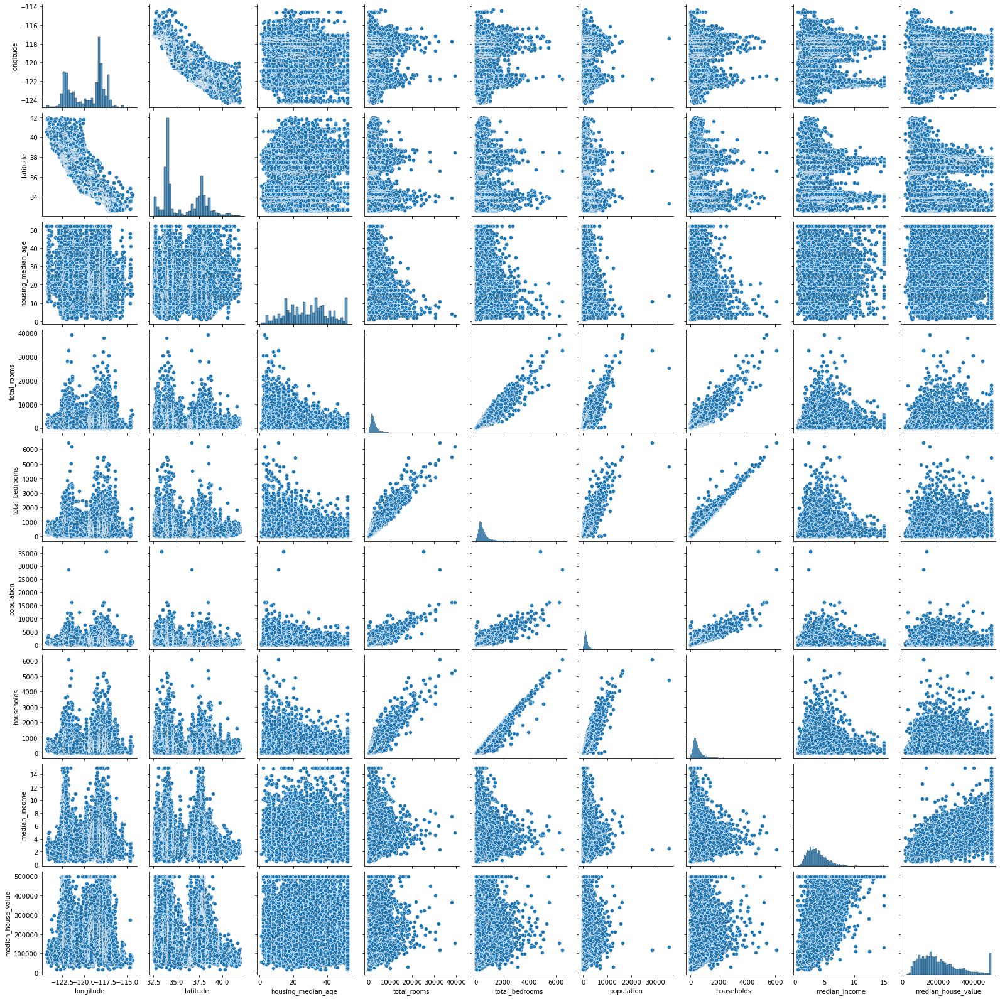

In [6]:
#columna contra columna
sns.pairplot(datos)

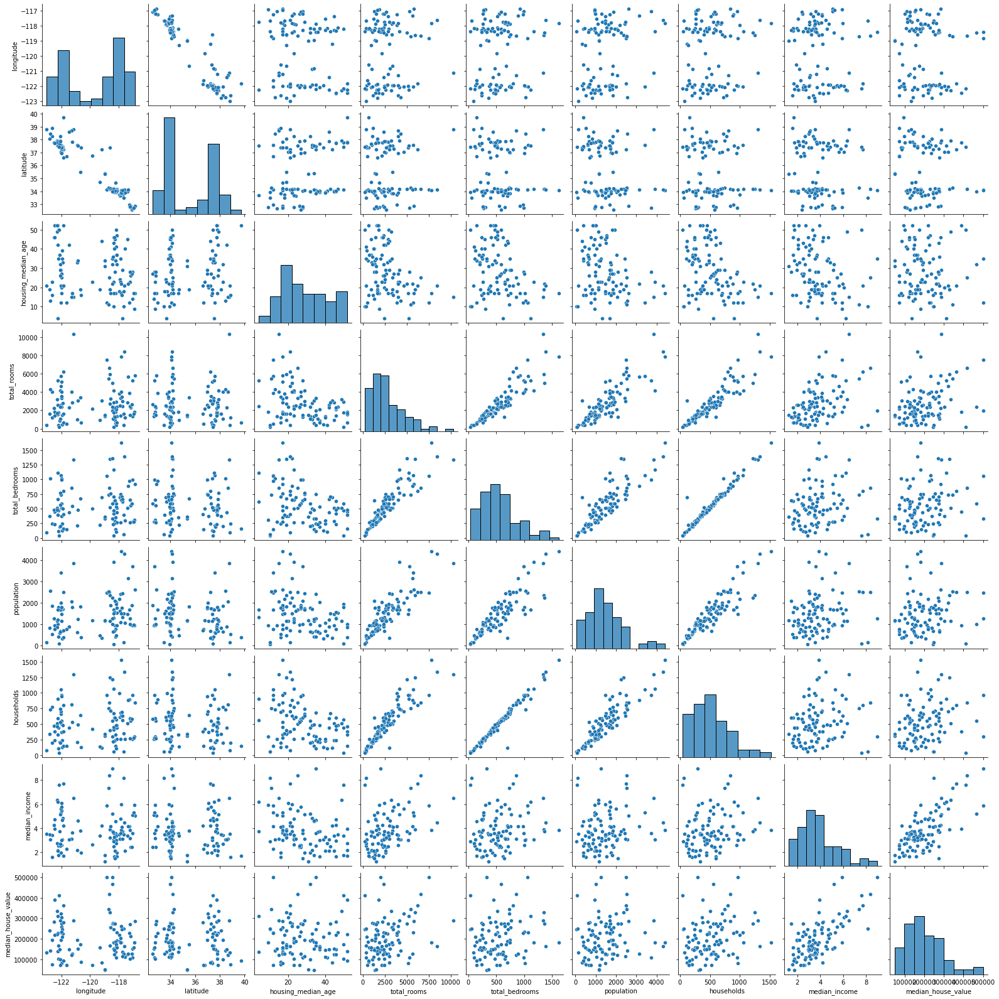

In [7]:
#tomando muestra aleatoria
sns.pairplot(datos.sample(100))

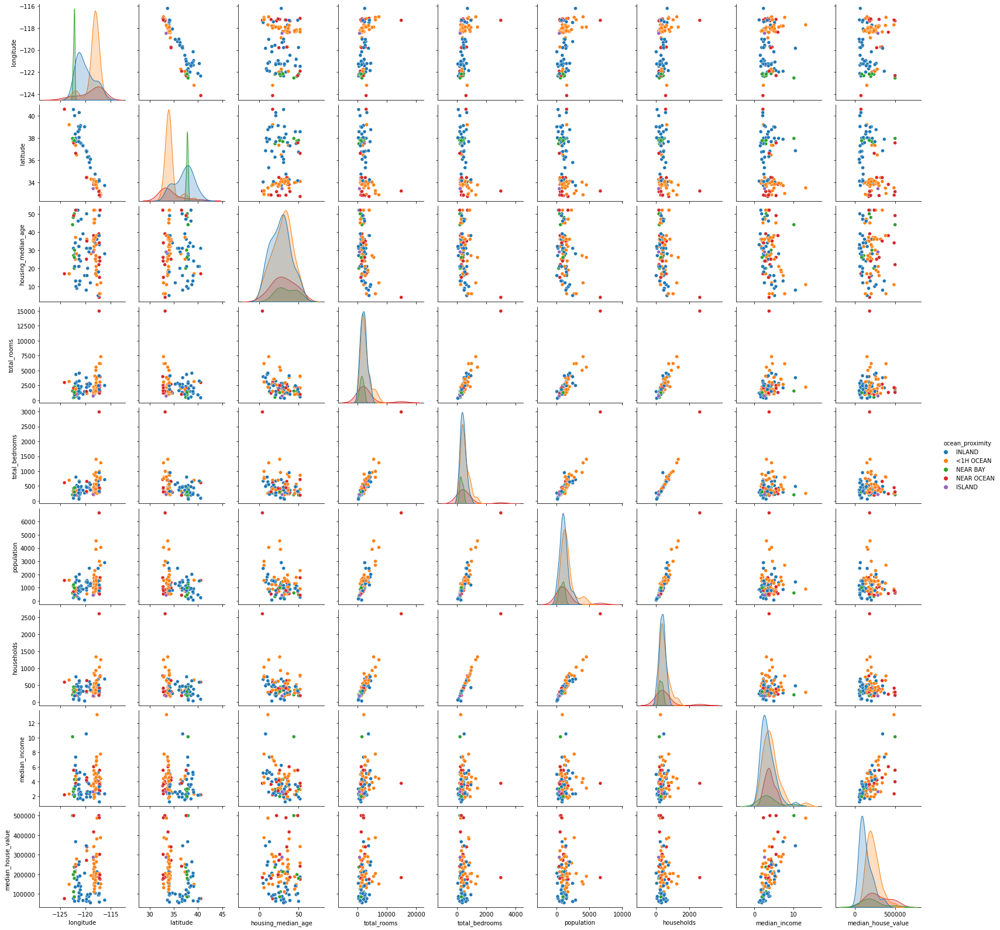

In [14]:
#distribución por clase
sns.pairplot(datos.sample(100),hue="ocean_proximity")

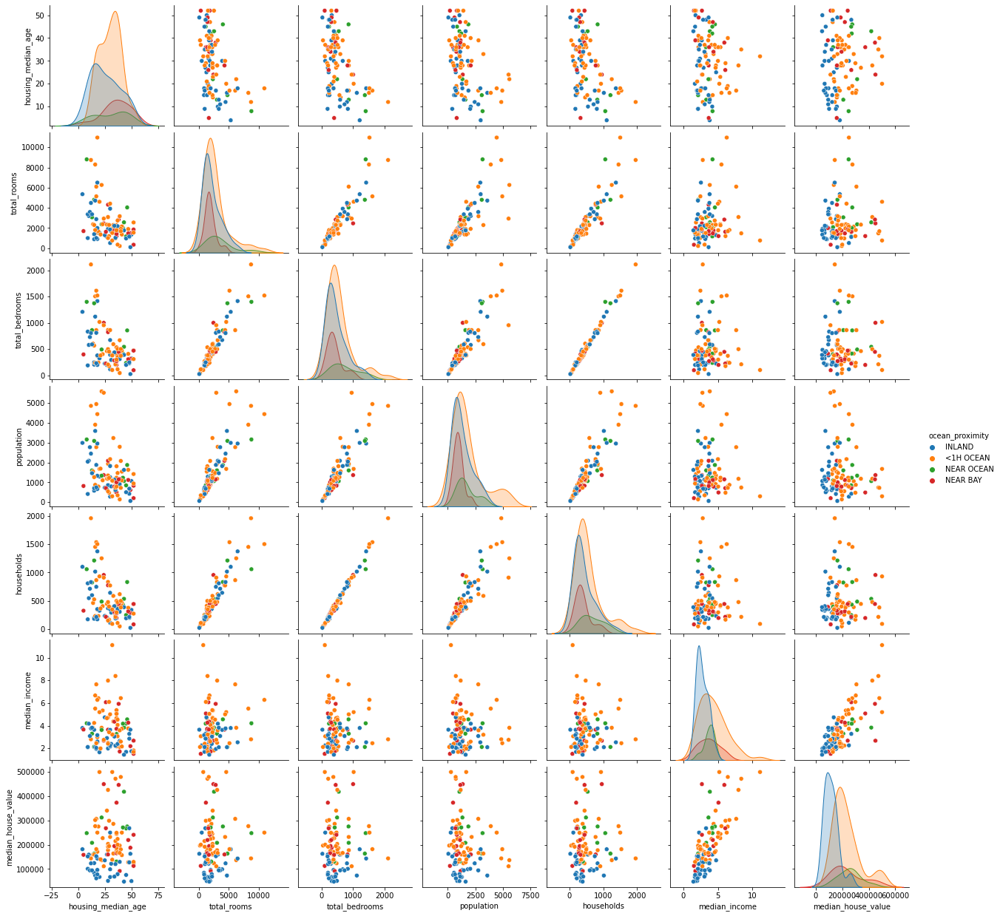

In [11]:
#distribución por clase eliminando columnas correlacionadas
sns.pairplot(datos.sample(100).drop(["latitude","longitude",], axis=1),hue="ocean_proximity")

In [16]:
#matriz varianza-covarianza
datos.corr()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.924664,-0.108197,0.044568,0.069608,0.099773,0.055310,-0.015176,-0.045967
latitude,-0.924664,1.000000,0.011173,-0.036100,-0.066983,-0.108785,-0.071035,-0.079809,-0.144160
housing_median_age,-0.108197,0.011173,1.000000,-0.361262,-0.320451,-0.296244,-0.302916,-0.119034,0.105623
total_rooms,0.044568,-0.036100,-0.361262,1.000000,0.930380,0.857126,0.918484,0.198050,0.134153
total_bedrooms,0.069608,-0.066983,-0.320451,0.930380,1.000000,0.877747,0.979728,-0.007723,0.049686
population,0.099773,-0.108785,-0.296244,0.857126,0.877747,1.000000,0.907222,0.004834,-0.024650
households,0.055310,-0.071035,-0.302916,0.918484,0.979728,0.907222,1.000000,0.013033,0.065843
median_income,-0.015176,-0.079809,-0.119034,0.198050,-0.007723,0.004834,0.013033,1.000000,0.688075
median_house_value,-0.045967,-0.144160,0.105623,0.134153,0.049686,-0.024650,0.065843,0.688075,1.000000


<AxesSubplot:xlabel='latitude', ylabel='Density'>

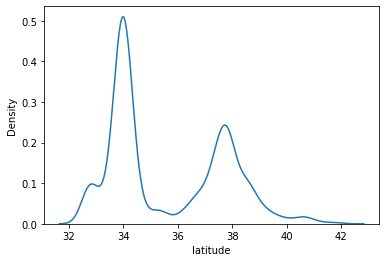

In [20]:
#¿Cómo se distribuyen las columnas?
sns.kdeplot(datos.latitude)

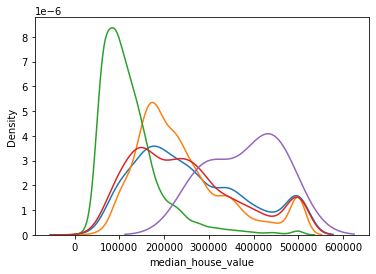

In [25]:
#Distribución por clase
for c in datos.ocean_proximity.unique():
    sns.kdeplot(datos[datos.ocean_proximity==c].median_house_value, label=c)


C:\Users\kevin\Dropbox\Python 3.9\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


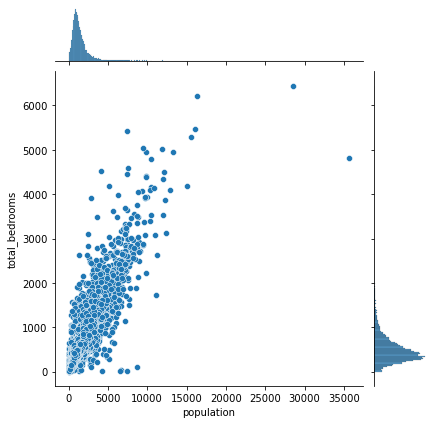

In [28]:
#distribución entre dos columnas
sns.jointplot("population","total_bedrooms",datos)



C:\Users\kevin\Dropbox\Python 3.9\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


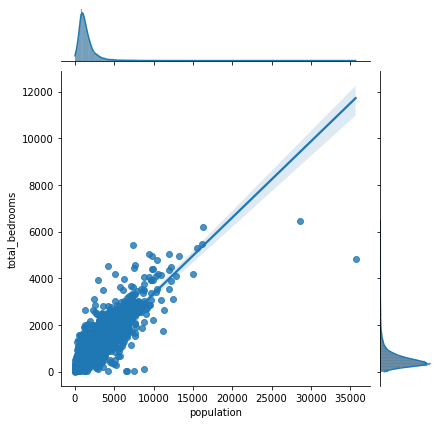

In [30]:
#distribución entre dos columnas con regresión
sns.jointplot("population","total_bedrooms",datos,kind="reg")


C:\Users\kevin\Dropbox\Python 3.9\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


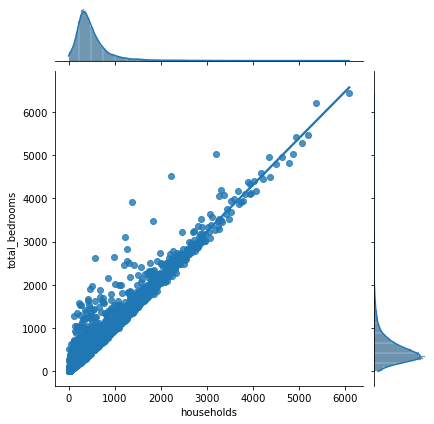

In [31]:
#datos más apropiados a una regresión
#distribución entre dos columnas con regresión
sns.jointplot("households","total_bedrooms",datos,kind="reg")



<AxesSubplot:>

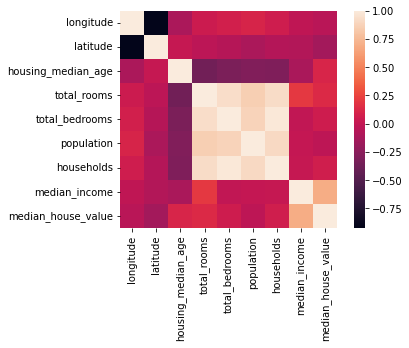

In [32]:
#mapa de calor para visualizar mejor las correlaciones
sns.heatmap(datos.corr(),square=True)

<AxesSubplot:>

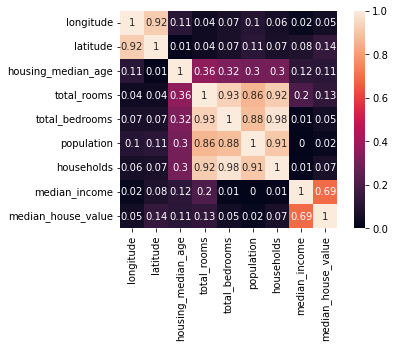

In [37]:
#mapa de calor con escala 0 a 1
sns.heatmap(datos.corr().abs().round(2),square=True,annot=True)

### Sobre estadística descriptiva

In [41]:
#media, mediana, varianza
datos.housing_median_age.mean(), datos.housing_median_age.median(), datos.housing_median_age.var()

(28.639486434108527, 29.0, 158.39626040778117)

In [43]:
#estadísticas agregadas totales
datos.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [45]:
#estadísticas agrupadas
datos.groupby("ocean_proximity").mean()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
ocean_proximity,,,,,,,,,
<1H OCEAN,-118.847766,34.560577,29.279225,2628.343586,546.539185,1520.290499,517.744965,4.230682,240084.285464
INLAND,-119.732990,36.731829,24.271867,2717.742787,533.881619,1391.046252,477.447565,3.208996,124805.392001
ISLAND,-118.354000,33.358000,42.400000,1574.600000,420.400000,668.000000,276.600000,2.744420,380440.000000
NEAR BAY,-122.260694,37.801057,37.730131,2493.589520,514.182819,1230.317467,488.616157,4.172885,259212.311790
NEAR OCEAN,-119.332555,34.738439,29.347254,2583.700903,538.615677,1354.008653,501.244545,4.005785,249433.977427


In [47]:
#en forma de diccionario
datos.agg({"longitude":["min","max","median","mean"],
         "latitude":["min","max","median","mean"] })

,longitude,latitude
min,-124.350000,32.540000
max,-114.310000,41.950000
median,-118.490000,34.260000
mean,-119.569704,35.631861


### Datos es subconjuntos


In [51]:
#Extrayendo datos con condición
datos.housing_median_age>30

0         True
1        False
2         True
3         True
4         True
         ...  
20635    False
20636    False
20637    False
20638    False
20639    False
Name: housing_median_age, Length: 20640, dtype: bool

In [54]:
#mostrar condición en DataFrame
datos[datos.housing_median_age >30]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41,880,129.0,322,126,8.3252,452600,NEAR BAY
2,-122.24,37.85,52,1467,190.0,496,177,7.2574,352100,NEAR BAY
3,-122.25,37.85,52,1274,235.0,558,219,5.6431,341300,NEAR BAY
4,-122.25,37.85,52,1627,280.0,565,259,3.8462,342200,NEAR BAY
5,-122.25,37.85,52,919,213.0,413,193,4.0368,269700,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20620,-121.48,39.05,40,198,41.0,151,48,4.5625,100000,INLAND
20621,-121.47,39.01,37,1244,247.0,484,157,2.3661,77500,INLAND
20623,-121.37,39.03,32,1158,244.0,598,227,2.8235,65500,INLAND
20625,-121.52,39.12,37,102,17.0,29,14,4.1250,72000,INLAND


In [61]:
#subconjunto con  variables categóricas
datos[datos.ocean_proximity.isin({"NEAR BAY", "ISLAND"}) & (datos.longitude<-121)]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41,880,129.0,322,126,8.3252,452600,NEAR BAY
1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,358500,NEAR BAY
2,-122.24,37.85,52,1467,190.0,496,177,7.2574,352100,NEAR BAY
3,-122.25,37.85,52,1274,235.0,558,219,5.6431,341300,NEAR BAY
4,-122.25,37.85,52,1627,280.0,565,259,3.8462,342200,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
19067,-122.45,38.28,20,3306,503.0,1374,460,5.7984,297600,NEAR BAY
19068,-122.47,38.29,14,3732,846.0,1277,775,2.5658,208000,NEAR BAY
19069,-122.45,38.27,25,5024,881.0,1994,838,4.2237,262300,NEAR BAY
19077,-122.49,38.27,8,5092,988.0,1657,936,3.5625,213200,NEAR BAY


In [63]:
#usando loc
datos.loc[:,["longitude","latitude"]]

,longitude,latitude
0,-122.23,37.88
1,-122.22,37.86
2,-122.24,37.85
3,-122.25,37.85
4,-122.25,37.85
...,...,...
20635,-121.09,39.48
20636,-121.21,39.49
20637,-121.22,39.43
20638,-121.32,39.43


In [67]:
#dado un rango
datos.loc[1:9,["longitude","latitude"]]

,longitude,latitude
1,-122.22,37.86
2,-122.24,37.85
3,-122.25,37.85
4,-122.25,37.85
5,-122.25,37.85
6,-122.25,37.84
7,-122.25,37.84
8,-122.26,37.84
9,-122.25,37.84


In [69]:
#cambiar indice
datos.set_index("latitude")

,longitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
latitude,,,,,,,,,
37.88,-122.23,41,880,129.0,322,126,8.3252,452600,NEAR BAY
37.86,-122.22,21,7099,1106.0,2401,1138,8.3014,358500,NEAR BAY
37.85,-122.24,52,1467,190.0,496,177,7.2574,352100,NEAR BAY
37.85,-122.25,52,1274,235.0,558,219,5.6431,341300,NEAR BAY
37.85,-122.25,52,1627,280.0,565,259,3.8462,342200,NEAR BAY
...,...,...,...,...,...,...,...,...,...
39.48,-121.09,25,1665,374.0,845,330,1.5603,78100,INLAND
39.49,-121.21,18,697,150.0,356,114,2.5568,77100,INLAND
39.43,-121.22,17,2254,485.0,1007,433,1.7000,92300,INLAND


In [76]:
#cambiar rango de nuevo indice
datos.loc[20630:]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
20630,-121.32,39.29,11,2640,505.0,1257,445,3.5673,112000,INLAND
20631,-121.40,39.33,15,2655,493.0,1200,432,3.5179,107200,INLAND
20632,-121.45,39.26,15,2319,416.0,1047,385,3.1250,115600,INLAND
20633,-121.53,39.19,27,2080,412.0,1082,382,2.5495,98300,INLAND
20634,-121.56,39.27,28,2332,395.0,1041,344,3.7125,116800,INLAND
20635,-121.09,39.48,25,1665,374.0,845,330,1.5603,78100,INLAND
20636,-121.21,39.49,18,697,150.0,356,114,2.5568,77100,INLAND
20637,-121.22,39.43,17,2254,485.0,1007,433,1.7000,92300,INLAND
20638,-121.32,39.43,18,1860,409.0,741,349,1.8672,84700,INLAND
20639,-121.24,39.37,16,2785,616.0,1387,530,2.3886,89400,INLAND


In [80]:
#Eliminar columnas
datos.drop(["longitude","latitude","population"], axis=1)

,housing_median_age,total_rooms,total_bedrooms,households,median_income,median_house_value,ocean_proximity
0,41,880,129.0,126,8.3252,452600,NEAR BAY
1,21,7099,1106.0,1138,8.3014,358500,NEAR BAY
2,52,1467,190.0,177,7.2574,352100,NEAR BAY
3,52,1274,235.0,219,5.6431,341300,NEAR BAY
4,52,1627,280.0,259,3.8462,342200,NEAR BAY
...,...,...,...,...,...,...,...
20635,25,1665,374.0,330,1.5603,78100,INLAND
20636,18,697,150.0,114,2.5568,77100,INLAND
20637,17,2254,485.0,433,1.7000,92300,INLAND
20638,18,1860,409.0,349,1.8672,84700,INLAND


In [86]:
pip install discover_feature_relationships
